### Importing Necessary Libraries

In [28]:
import os
from PIL import Image
from directory_tree import display_tree

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img, img_to_array

## Train Data

The training data consists of $16000$ images along with their labels.

In [44]:
labels = pd.read_csv("./Data/train_labels.csv")
images = ['./Data/train/train/'+str(name)+'.tif' for name in labels['id']]
labels['images'] = images
labels = labels[['id', 'images', 'label']]
labels

,id,images,label
0,0,./Data/train/train/0.tif,1
1,1,./Data/train/train/1.tif,13
2,2,./Data/train/train/2.tif,13
3,3,./Data/train/train/3.tif,14
4,4,./Data/train/train/4.tif,6
...,...,...,...
15995,15995,./Data/train/train/15995.tif,2
15996,15996,./Data/train/train/15996.tif,15
15997,15997,./Data/train/train/15997.tif,3
15998,15998,./Data/train/train/15998.tif,9


The labels are ranging from $0-15$ for the following mentioned document types.

In [45]:
class_labels = list(set(labels['label']))
class_names = [
    'letter', 'form', 'email', 'handwritten', 'advertisement', 'scientific report', 'scientific publication',
    'specification', 'file folder', 'news article', 'budget', 'invoice', 'presentation', 'questionnaire', 'resume',
    'memo'
]
label_names = pd.DataFrame({
    'labels': class_labels,
    'names': class_names
})
label_names

,labels,names
0,0,letter
1,1,form
2,2,email
3,3,handwritten
4,4,advertisement
5,5,scientific report
6,6,scientific publication
7,7,specification
8,8,file folder
9,9,news article


There is no class imbalance in the training dataset and each class is well represented with $\sim 1000$ images per class label.

In [46]:
pd.value_counts(labels['label'])

8     1059
6     1044
0     1032
12    1020
5     1012
11    1011
13    1007
9     1000
3      993
14     992
15     988
10     974
1      969
2      968
4      966
7      965
Name: label, dtype: int64

Let's take a look at the document images for each class to get an idea of what sort of documents and their images we are dealing with.

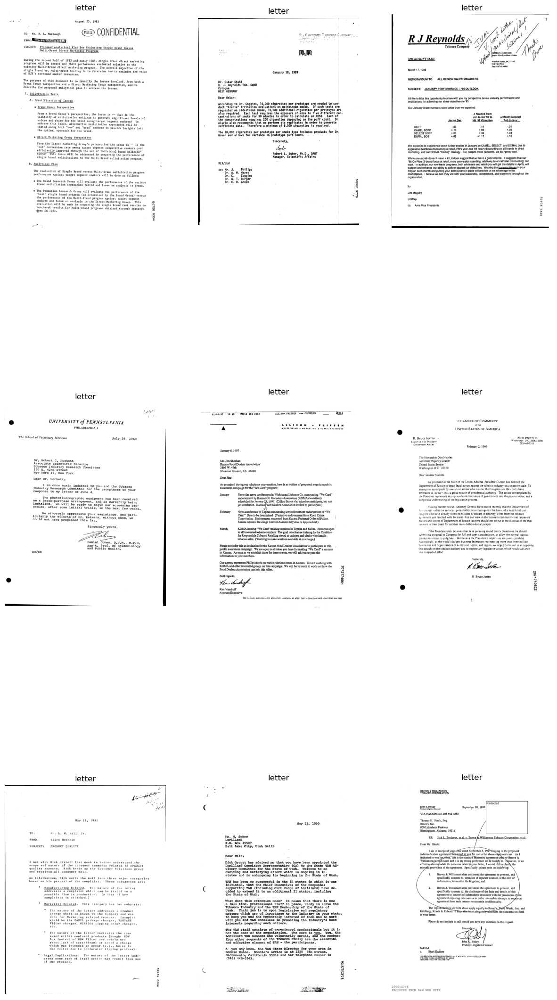

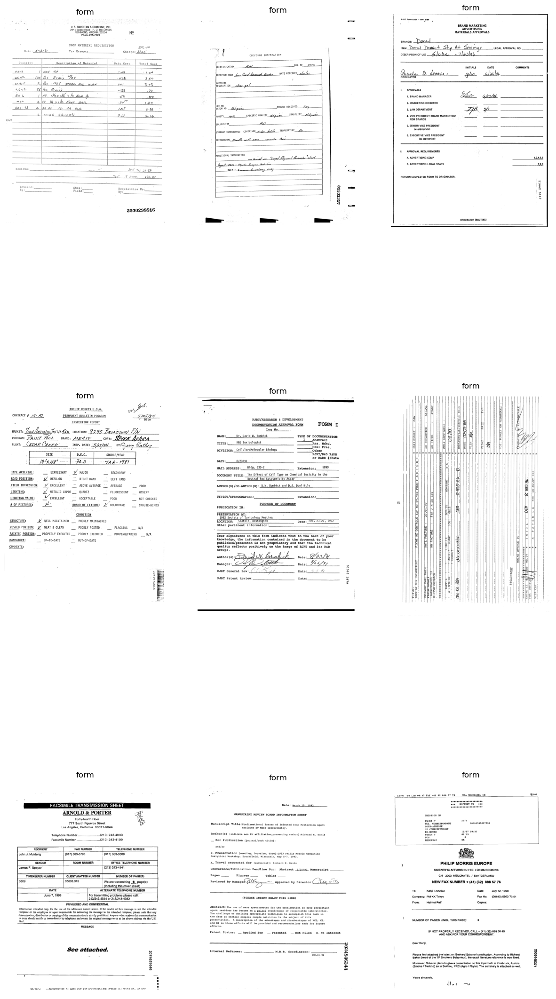

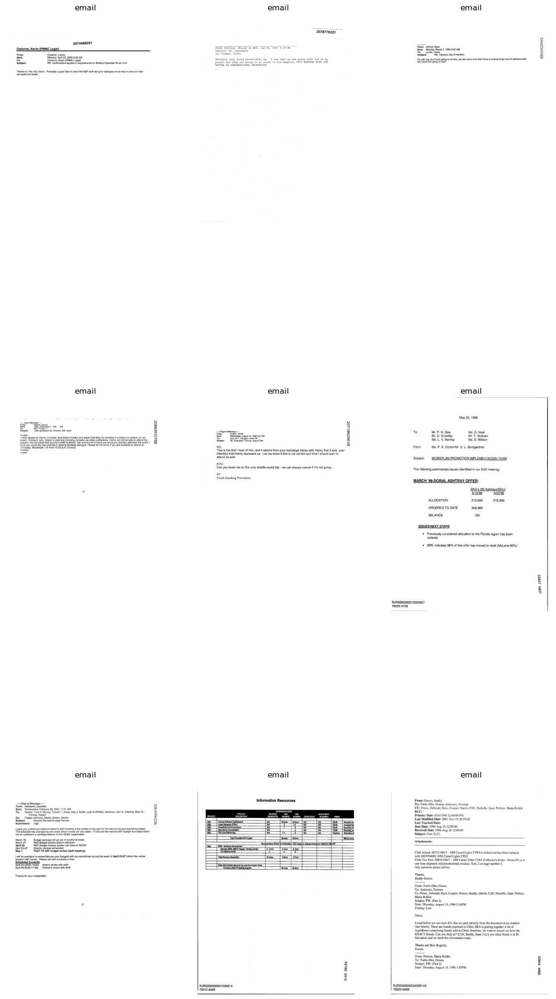

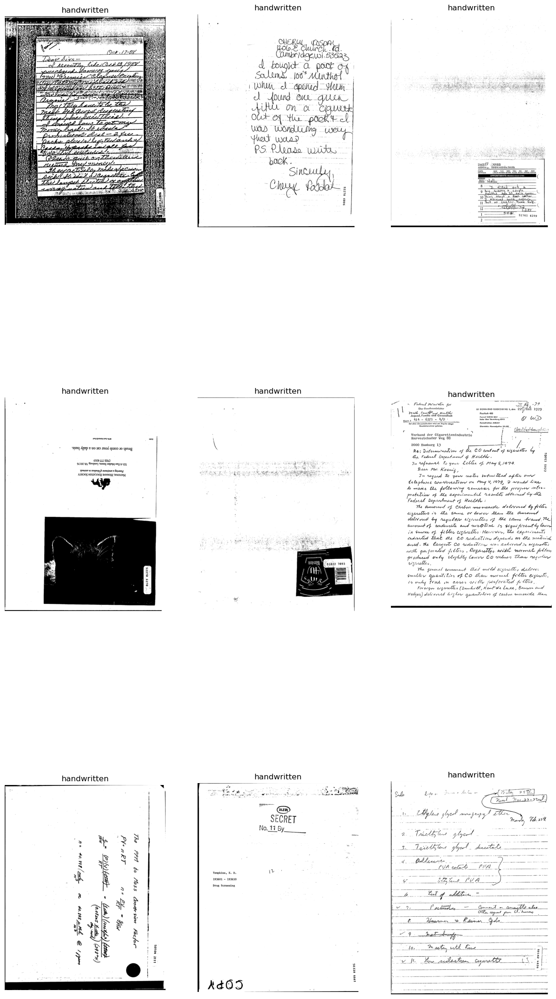

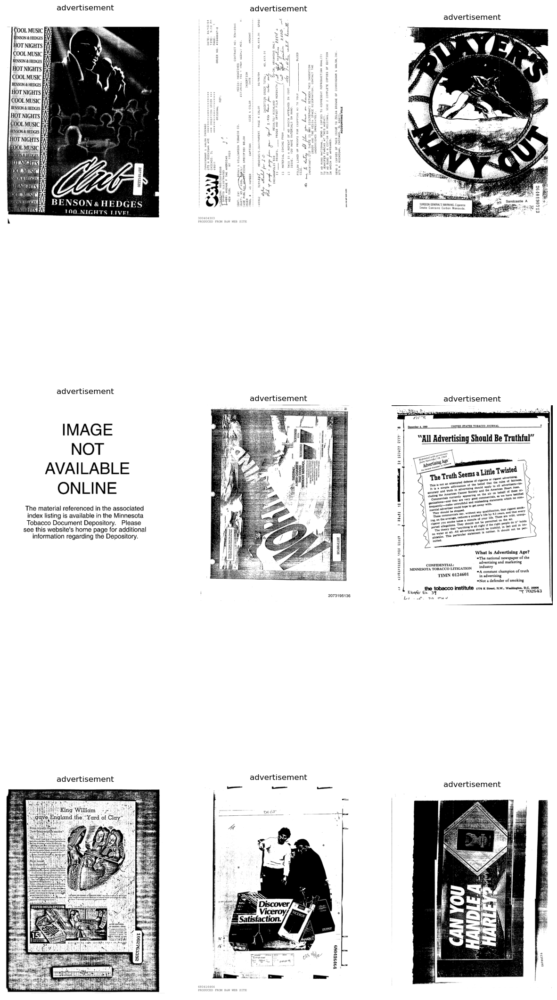

...

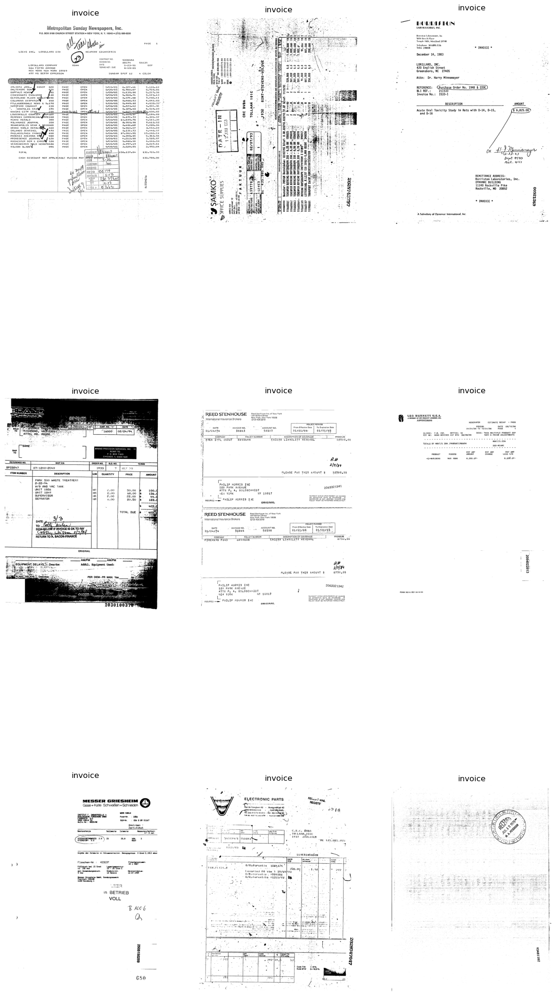

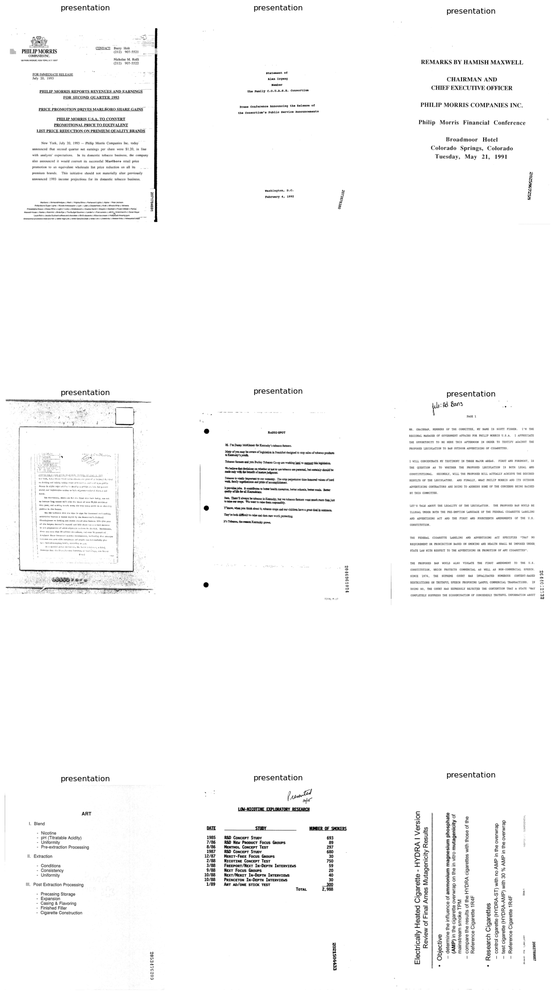

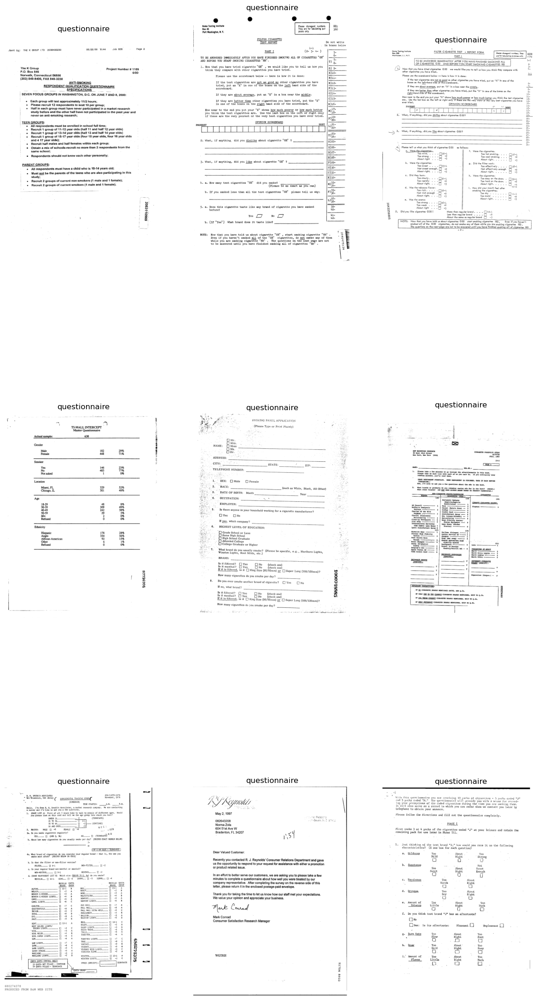

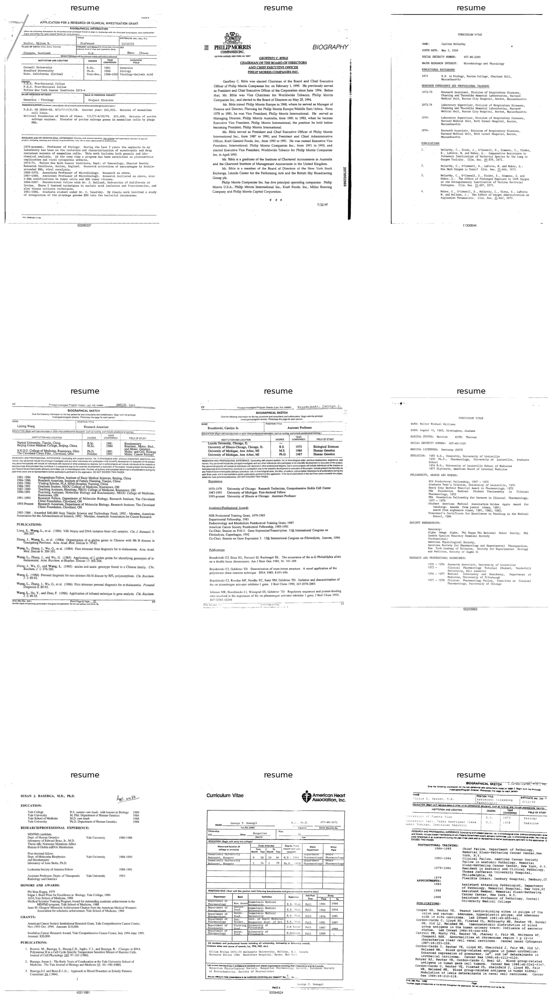

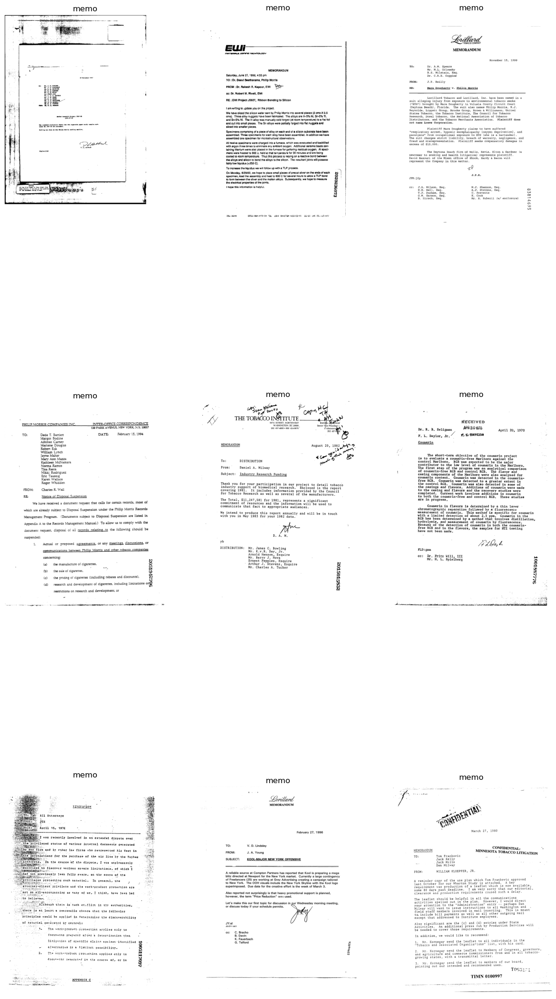

In [106]:
for i in range(len(class_labels)):
    fig, ax = plt.subplots(3, 3, figsize=(15, 30))
    imgs = [tf.cast(img_to_array(load_img(name)), dtype=tf.uint8) for name in list(labels[labels.label == i][:9]['images'])]
    m = 0
    for j in range(3):
        for k in range(3):
            ax[j, k].imshow(imgs[m])
            ax[j, k].axis('off')
            ax[j, k].set_title(class_names[i])
            m += 1

It is evident that there are wrongly labeled images. Let's look at few images from validation set.

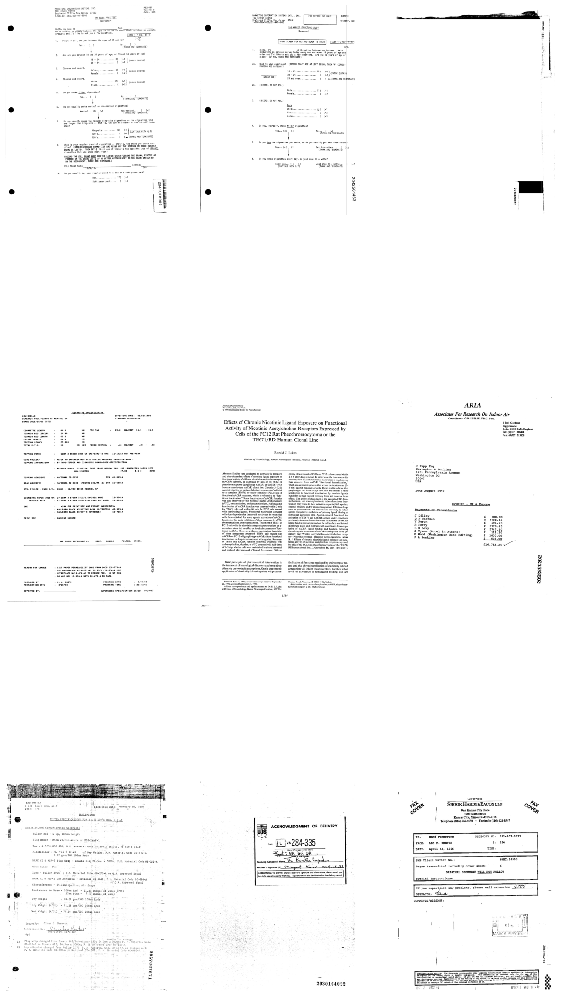

In [102]:
fig, ax = plt.subplots(3, 3, figsize=(15, 30))
imgs = [tf.cast(img_to_array(load_img('./Data/validation/validation/'+name)), dtype=tf.uint8) for name in os.listdir('./Data/validation/validation')[:9]]
m = 0
for j in range(3):
    for k in range(3):
        ax[j, k].imshow(imgs[m])
        ax[j, k].axis('off')
        m += 1

## Data Preparation

Since, there is a lot of image data instead of using the whole data at once in a tensor form, we would be using a data generator to prevent memory issues.

In [69]:
heights = [img.shape[0] for img in imgs]
widths = [img.shape[1] for img in imgs]
print("")
print("Mean Image Height:", np.mean(heights))
print("Mean Image Width:", np.mean(widths))
print("Min Image Height:", np.min(heights))
print("Min Image Width:", np.min(widths))


Mean Image Height: 1000.0
Mean Image Width: 768.4444444444445
Min Image Height: 1000
Min Image Width: 754


Observing the average image heights and widths, it is observed that setting image height to $1000$ and image width to $750$ is reseonable for training the model. Batch Size is set to $64$.

In [84]:
BATCH_SIZE = 64
INPUT_SHAPE = (1000, 750)

Since, the Keras' own data generator does not support TIFF images, we resort to writing our own custom data generator. It can also be leveraged to put custom image pre-processing or multi-input or output in the data processing pipeline.

In [85]:
class ImageDataGenerator(tf.keras.utils.Sequence):
    def __init__(self, df, X_col, y_col, batch_size, input_size=(1000, 600), shuffle=True):
        self.df = df.copy() # DataFrame consisting image paths of inputs and the labels for the outputs
        self.X_col = X_col # Input column, specifying image path, in the DataFrame
        self.y_col = y_col # Output column, specifying corresponding label, in the DataFrame
        self.batch_size = batch_size # Batch Size
        self.input_size = input_size # Input Image size
        self.shuffle = shuffle # Shuffle Data after each epoch
        self.n = len(self.df) # length of the entire data
    
    def on_epoch_end(self):
        if self.shuffle:
            self.df = self.df.sample(frac=1).reset_index(drop=True)
    
    def __get_input(self, path):
        img_arr = img_to_array(load_img(path))
        # some other pre-processing / data-augmentation goes here
        img_arr = tf.image.resize(img_arr, self.input_size)
        return img_arr/255.0
    
    def __get_data(self, batches):
        batch_paths = batches[self.X_col]
        batch_labels = batches[self.y_col]
        X_batch = tf.cast([self.__get_input(path) for path in batch_paths], dtype=tf.float32)
        y_batch = tf.cast(batch_labels, dtype=tf.float32)
        return X_batch, y_batch
    
    def __getitem__(self, index):
        batches = self.df[index * self.batch_size:(index + 1) * self.batch_size]
        X, y = self.__get_data(batches)
        return X, y
    
    def __len__(self):
        return self.n // self.batch_size

In [86]:
train_generator = ImageDataGenerator(
    df=labels,
    X_col='images',
    y_col='label',
    batch_size=BATCH_SIZE,
    input_size=INPUT_SHAPE
)

Below shows one batch from the ImageDataGenerator.

In [87]:
batch = next(iter(train_generator))
print('*** Batch Overview ***')
print('Input Image Tensor Shape:', batch[0].shape)
print('Output Label Tensor Shape:', batch[1].shape)

*** Batch Overview ***
Input Image Tensor Shape: (64, 1000, 750, 3)
Output Label Tensor Shape: (64,)


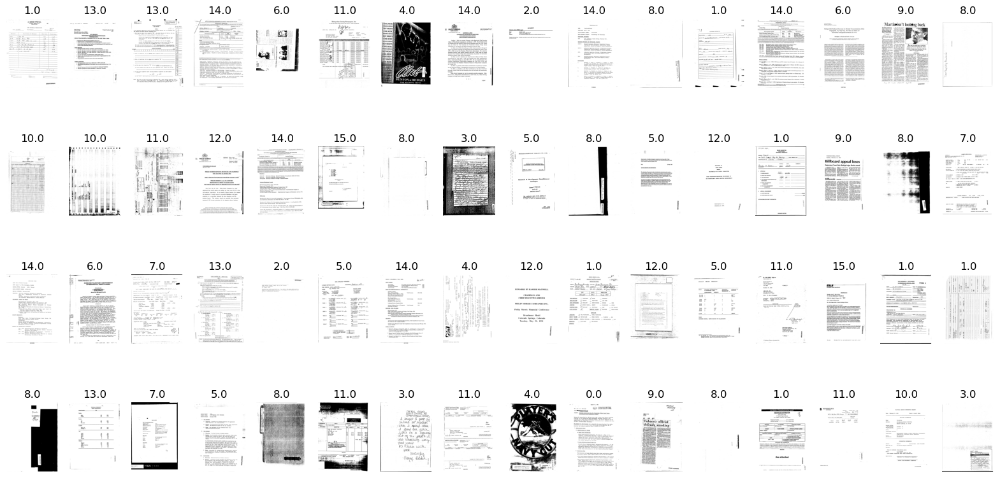

In [97]:
fig, ax = plt.subplots(4, 16, figsize=(20, 10))
imgs = batch[0]
labs = list(batch[1].numpy())
m = 0
for j in range(4):
    for k in range(16):
        ax[j, k].imshow((imgs[m]*255).numpy().astype(np.uint8))
        ax[j, k].axis('off')
        ax[j, k].set_title(labs[m])
        m += 1